In [1]:
%matplotlib inline
#from __future__ import division, print_function
#import sys
import numpy as np
from astropy.table import Table
import matplotlib.pyplot as plt
#from astropy.coordinates import SkyCoord
from matplotlib.ticker import NullFormatter
#from astropy import units as u
import fitsio
import pandas as pd
from astropy.io import ascii
#from astropy.coordinates import SkyCoord
import sys, os, time, argparse, glob
#import matplotlib.patches as patches
import warnings; warnings.simplefilter('ignore')

#from desitarget.targetmask import desi_mask
from matplotlib_venn import venn2, venn2_circles
from matplotlib_venn import venn3, venn3_circles
import random

#from pyvenn import venn
#from matplotlib_chord_diagram import matplotlib_chord

from desitarget.targetmask import desi_mask, bgs_mask
from main_def import cut_sweeps, cut, load_cat_caseA, load_cat_caseA_SV, load_cat_caseB, load_cat_caseC, load_cat_caseD, get_mag_decals, MASK, unextinct_fluxes, flux_to_mag, matrix_plot, bar_plot, venn_plot, target_con

# Star- Galaxy separation

Starting point from SWEEPS:

* (200 < RA < 230)   &   (-2 < DEC < 5) --> 200 s.q degrees --> 18960357
* (r < 20) & (Grr > 0.6) | (gaiagmag == 0) --> 356741


Star-Galaxy separation cuts:

* nobs_r > 0
* fracmasked_r < 0.4 
* fracflux_r < 5
* fracin_r > 0.3
* flux_ivar_r > 0
* -1 < g-r < 4
* -1 < r-z < 4
* BRIGHTSTARINBLOB

Total targets for case D: 312430

Total dropped out for case D: 44311

## Loading catalogues and applying conditions

In [2]:
sweep_dir = os.path.join('/global/project/projectdirs/cosmo/data/legacysurvey/','dr7', 'sweep', '7.1')
catS = cut_sweeps(200, 230, -2,5, sweep_dir)

#columns0 = ['RA', 'DEC', 'DESI_TARGET', 'BGS_TARGET']
#TrgCat = '/global/homes/q/qmxp55/DESI/desitarget_data/targetdir/targets-dr7.1-0.26.0.fits'
#catT = fitsio.read(TrgCat, columns=columns0, ext=1)
#catT = cut(200, 230, -2,5, catT)

sweep-200m005-210p000 1688738
sweep-200p000-210p005 4086987
sweep-210m005-220p000 1739258
sweep-210p000-220p005 4353884
sweep-220m005-230p000 2276054
sweep-220p000-230p005 4815436
Bricks that matched: 6
Sample region # objects: 18960357


In [3]:
cat, catr, cat0, matrix_in, matrix_out, mask_list_MAG, dropped = load_cat_caseA_SV(
    catS, catT=None, FILE=False, desitarget=False)

Lenght raw catalogue: 18960357
Lenght DR7 sample within r < 20.2: 1162282
Lenght DR7 sample after cuts 1012926
adding Grr column to catalogue...


In [46]:
def fibFtoF(cat, rMAX):
    
    g, r, z, w1, G, rr = get_mag_decals(cat)
    GAIA_GAL = np.concatenate((cat[cat['Grr'] > 0.6], cat[G == 0]))
    GAIA_STAR = cat[(cat['Grr']  <  0.6) & (G != 0)]

    g1, r1, z1, w11, G1, rr1 = get_mag_decals(GAIA_GAL)
    g2, r2, z2, w12, G2, rr2 = get_mag_decals(GAIA_STAR)
    
    FG = GAIA_GAL['FIBERFLUX_R']/GAIA_GAL['FLUX_R']
    FS = GAIA_STAR['FIBERFLUX_R']/GAIA_STAR['FLUX_R']
    Fmin = np.array([FG.min(), FS.min()])
    Fmax = np.array([FG.max(), FS.max()])
    print('Fmin = %f --> Fmax = %f' %(Fmin.min(), Fmax.max()))
    FA = np.linspace(Fmin.min(), Fmax.max(), 100)
    fileout = []
    
        
    FGtmp = FG[r1 <= rMAX]
    FStmp = FS[r2 <= rMAX]
        
    for i in range(len(FA)):
        
        fracGAL = len(FGtmp[FGtmp <= FA[i]])/len(FGtmp)
        fracSTAR = len(FStmp[FStmp <= FS[i]])/len(FStmp)
        
        fileout.append([FA[i], fracGAL, fracSTAR])
    
    fileout = np.array(fileout).transpose()
    
    return fileout

In [47]:
fib_17 = fibFtoF(cat, 17)
fib_18 = fibFtoF(cat, 18)
fib_19 = fibFtoF(cat, 19)
fib_20 = fibFtoF(cat, 20)
fib_202 = fibFtoF(cat, 20.2)

Fmin = 0.000000 --> Fmax = 0.779130
Fmin = 0.000000 --> Fmax = 0.779130
Fmin = 0.000000 --> Fmax = 0.779130
Fmin = 0.000000 --> Fmax = 0.779130
Fmin = 0.000000 --> Fmax = 0.779130


Text(0,0.5,'$f$')

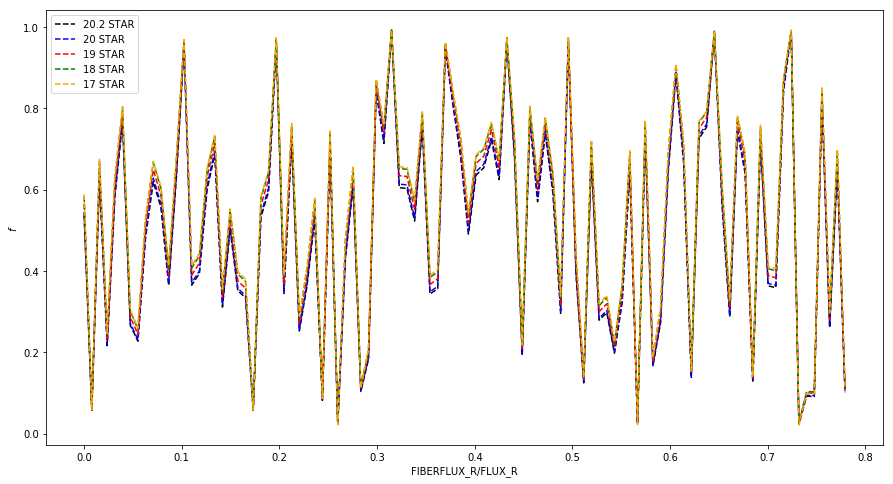

In [49]:
plt.figure(figsize=(15, 8))

#plt.plot(fib_202[0], fib_202[1], linestyle='-', c='black', label=r'20.2 GAL')
plt.plot(fib_202[0], fib_202[2], linestyle='--', c='black', label=r'20.2 STAR')

#plt.plot(fib_20[0], fib_20[1], linestyle='-', c='b', label=r'20 GAL')
plt.plot(fib_20[0], fib_20[2], linestyle='--', c='b', label=r'20 STAR')

#plt.plot(fib_19[0], fib_19[1], linestyle='-', c='r', label=r'19 GAL')
plt.plot(fib_19[0], fib_19[2], linestyle='--', c='r', label=r'19 STAR')

#plt.plot(fib_18[0], fib_18[1], linestyle='-', c='green', label=r'18 GAL')
plt.plot(fib_18[0], fib_18[2], linestyle='--', c='green', label=r'18 STAR')

#plt.plot(fib_17[0], fib_17[1], linestyle='-', c='orange', label=r'17 GAL')
plt.plot(fib_17[0], fib_17[2], linestyle='--', c='orange', label=r'17 STAR')

plt.legend()
plt.xlabel(r'FIBERFLUX_R/FLUX_R')
plt.ylabel(r'$f$')

In [12]:
def fibHist(cat):
    
    g, r, z, w1, G, rr = get_mag_decals(cat)
    GAIA_GAL = np.concatenate((cat[cat['Grr'] > 0.6], cat[G == 0]))
    GAIA_STAR = cat[(cat['Grr']  <  0.6) & (G != 0)]

    g1, r1, z1, w11, G1, rr1 = get_mag_decals(GAIA_GAL)
    g2, r2, z2, w12, G2, rr2 = get_mag_decals(GAIA_STAR)
    
    FT = cat['FIBERFLUX_R']/cat['FLUX_R']
    FG = GAIA_GAL['FIBERFLUX_R']/GAIA_GAL['FLUX_R']
    FS = GAIA_STAR['FIBERFLUX_R']/GAIA_STAR['FLUX_R']
    
    bins = np.linspace(0, 0.8, 30)

    plt.figure(figsize=(12, 7))
    
    #plt.hist(FT, bins=bins, histtype='step', stacked=True, fill=False, lw = 2, color='black', label=r'tot')
    plt.hist(FS[r2 <= 20], bins=bins, histtype='step', stacked=True, fill=False, log=False,alpha=1, lw = 2, color='red', linestyle='--', label=r'GAIA STAR r<20')
    plt.hist(FG[r1 <= 20], bins=bins, histtype='step', stacked=True, fill=False, log=False,alpha=1, lw = 2, color='blue', linestyle='--', label=r'GAIA GAL r<20')
       
    plt.hist(FS, bins=bins, histtype='step', stacked=True, fill=False, log=False, lw = 2, color='red', label=r'GAIA STAR')
    plt.hist(FG, bins=bins, histtype='step', stacked=True, fill=False, log=False, lw = 2, color='blue', label=r'GAIA GAL')
    
    plt.hist(FS[r2 >= 20], bins=bins, histtype='step', stacked=True, fill=False, log=False,alpha=1, color='red', linestyle='-.', label=r'GAIA STAR r>20')
    plt.hist(FG[r1 >= 20], bins=bins, histtype='step', stacked=True, fill=False, log=False,alpha=1, color='blue', linestyle='-.', label=r'GAIA GAL r>20')

    plt.axvline(np.mean(FG), linestyle='-', c='green')
    plt.axvline(np.mean(FG[r1 <= 20]), linestyle='--', c='green')
    plt.axvline(np.mean(FG[r1 >= 20]), linestyle='-.', c='green')
    
    plt.text(0.5, 25000, r'Gal tot STD: %g' %(np.std(FG)))
    
    plt.ylim(0, 31000)
    plt.xlabel(r'FIBERFLUX_R/FLUX_R')
    plt.legend()
    plt.show()

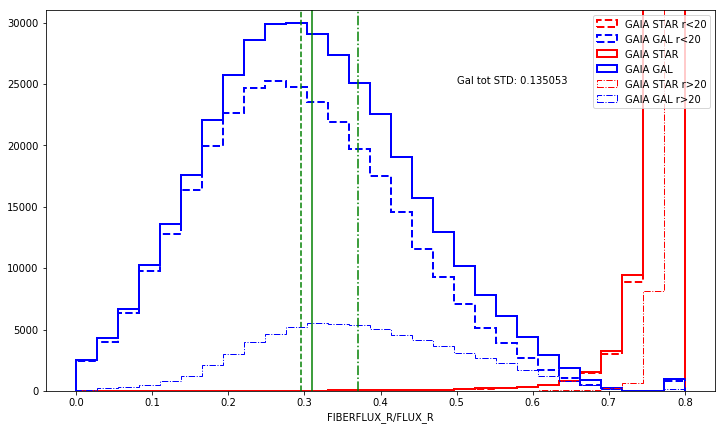

In [13]:
fibHist(cat)

In [6]:
def PSFdist(cat):
    
    CAT = cat[cat['TYPE'] == b'PSF ']
    g, r, z, w1, G, rr = get_mag_decals(CAT)
    rbin = np.linspace(r.min(), r.max(), 20)
    print('PSF objects in GAIA: %d' %(len(CAT[G != 0])))
    print('PSF objects not in GAIA: %d' %(len(CAT[G == 0])))
    file = []
    
    for i in range(len(rbin)):
        
        CAT_G0 = len(CAT[(G == 0) & (r <= rbin[i])])/len(CAT) #not in GAIA
        CAT_G1 = len(CAT[(G != 0) & (r <= rbin[i])])/len(CAT) #in GAIA
        
        file.append([rbin[i], CAT_G0, CAT_G1])
    
    fileout = np.array(file).transpose()
    
    return fileout

In [7]:
stars_dist = PSFdist(cat)

PSF objects in GAIA: 57438
PSF objects not in GAIA: 74


Text(0,0.5,'$f$')

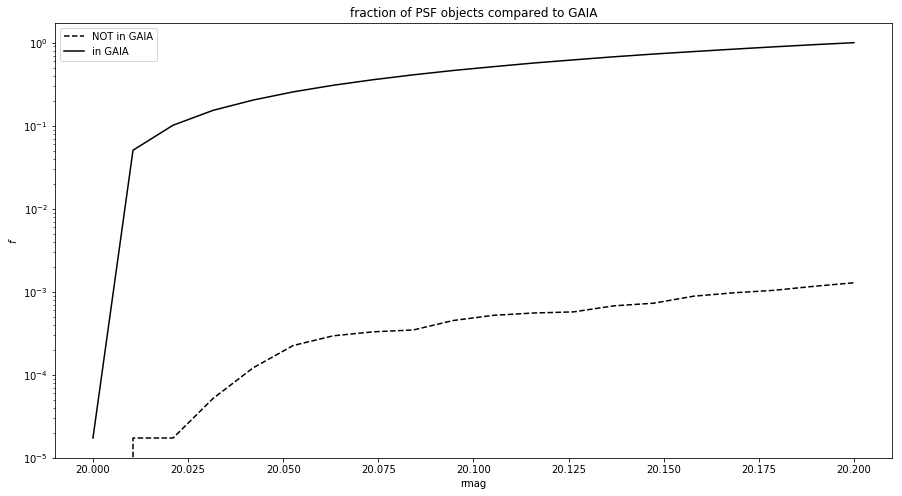

In [8]:
plt.figure(figsize=(15, 8))

plt.semilogy(stars_dist[0], stars_dist[1], linestyle='--', c='black', label=r'NOT in GAIA')
plt.semilogy(stars_dist[0], stars_dist[2], linestyle='-', c='black', label=r'in GAIA')

plt.legend()

plt.title(r'fraction of PSF objects compared to GAIA')
plt.xlabel(r'rmag')
plt.ylabel(r'$f$')

In [4]:
def nobs_plot(catr, cat, title):

    print('before QC:', len(catr))
    print('after QC:', len(cat))

    #plt.figure(figsize=(25.71, 6))
    plt.figure(figsize=(18, 10))

    plt.title('GAIA GAL %s' %(title))
    plt.scatter(catr['RA'], catr['DEC'], s=0.1, c='red')
    plt.scatter(cat['RA'], cat['DEC'], s=0.1, c='blue')
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.show()

    plt.show()

before QC: 1162282
after QC: 1012926


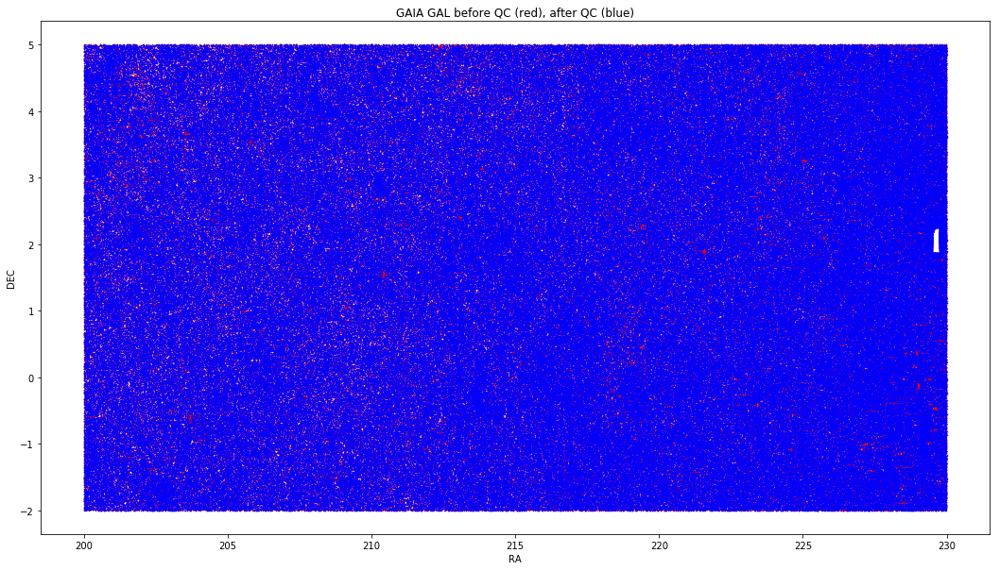

In [5]:
nobs_plot(catr, cat, 'before QC (red), after QC (blue)')

## QUALITY CUTS ANALYSIS

In [9]:
#dropped_2 = dropped.drop(['maskFLUX', 'maskMAG'])
#dropped_2 = dropped_2.drop(['PSF_r_per', 'NOPSF_r_per'], axis=1)
#dropped_2.columns = ['drop #', 'drop %']
dropped

,drop_r,drop_r_per,PSF_r_per,NOPSF_r_per
maskNOBS,157.0,0.119218,44.585987,55.414013
maskMAG,0.0,0.000000,0.000000,0.000000
maskFRACMASKED,915.0,0.694808,32.021858,67.978142
maskFRACFLUX,1946.0,1.477702,14.388489,85.611511
maskFRACIN,873.0,0.662915,8.934708,91.065292
maskFLUX_IVAR,79.0,0.059989,51.898734,48.101266
mask_gr,652.0,0.495098,18.711656,81.288344
mask_rz,798.0,0.605964,15.162907,84.837093
maskBRIGHTSTAR,2633.0,1.999377,91.264717,8.735283


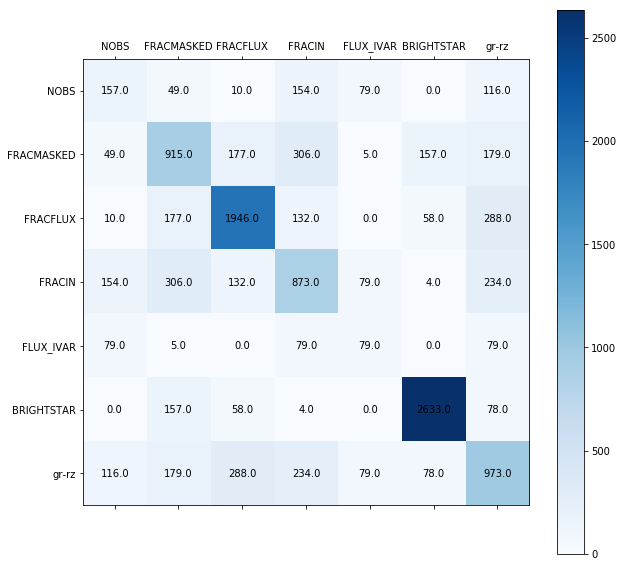

In [10]:
Mu = [[0 for x in range(len(matrix_out))] for y in range(len(matrix_out))] 
    
from itertools import product
for i,j in product(range(len(matrix_out)), range(len(matrix_out))):
    Mu[i][j] = np.array(matrix_out)[i][i] - np.array(matrix_out)[i][j]
    if i == j:
        Mu[i][j] = np.array(matrix_out)[i][j]

    #Mu[i][j] = 100 - 100*np.array(matrix_out)[i][j]/np.array(matrix_out)[i][i]
    #if i == j:
        #Mu[i][j] = 100*np.array(matrix_out)[i][j]/np.array(matrix_out)[i][i]
                    
#matrix_plot(np.array(matrix_out), np.array(matrix_out.index), np.array(matrix_out.columns))
matrix_plot(Mu, np.array(matrix_out.columns), np.array(matrix_out.columns))

In [8]:
#df_Mu = pd.DataFrame(Mu, index=matrix_out.index, columns=matrix_out.columns)
#bar_plot(df_Mu)

In [11]:
def save_from_venn(catr, vennData, mask, N, outFile):
    g, r, z, w1, G, rr = get_mag_decals(catr)
    sampleCat = catr['RA', 'DEC'][vennData[mask]]
    sampleCat['rmag'] = r[vennData[mask]]
    ranSelect = random.sample(range(len(sampleCat)), N)
    ascii.write(sampleCat[ranSelect], outFile, overwrite=True)
    
    return sampleCat[ranSelect]

Objects out alone...
FRACMASKED: 590
FRACFLUX: 1720
BRIGHTSTAR: 2427
Objects out together...
FRACMASKED-FRACFLUX: 177
FRACMASKED-BRIGHTSTAR: 157
FRACFLUX-BRIGHTSTAR: 58
FRACMASKED-FRACFLUX-BRIGHTSTAR: 9
---------------------
5102 objects out of a total 5996 = 85.09 %


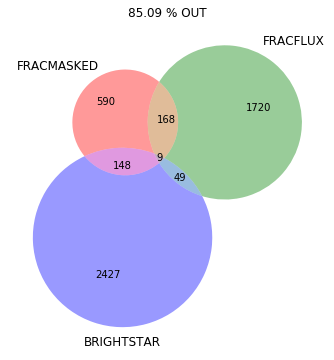

In [12]:
venn_outs_125 = venn_plot(catr, cat, mask_list_MAG, 1, 2, 5, ('FRACMASKED', 'FRACFLUX', 'BRIGHTSTAR'), pos='out', title='OUT')

Objects out alone...
FRACMASKED: 476
FRACFLUX: 1681
FRACIN: 479
Objects out together...
FRACMASKED-FRACFLUX: 177
FRACMASKED-FRACIN: 306
FRACFLUX-FRACIN: 132
FRACMASKED-FRACFLUX-FRACIN: 44
---------------------
3119 objects out of a total 5996 = 52.02 %


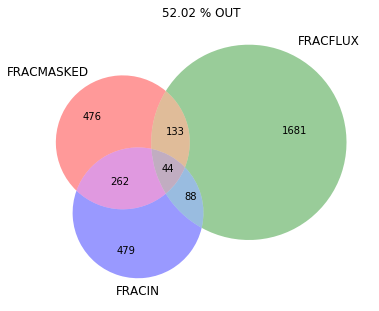

In [13]:
venn_outs_123 = venn_plot(catr, cat, mask_list_MAG, 1, 2, 3, ('FRACMASKED', 'FRACFLUX', 'FRACIN'), pos='out', title='OUT')

Objects out alone...
NOBS: 3
FRACIN: 719
FLUX_IVAR: 0
Objects out together...
NOBS-FRACIN: 154
NOBS-FLUX_IVAR: 79
FRACIN-FLUX_IVAR: 79
NOBS-FRACIN-FLUX_IVAR: 79
---------------------
797 objects out of a total 5996 = 13.29 %


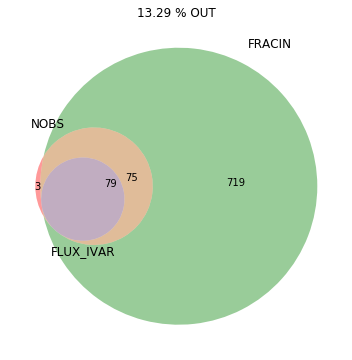

In [14]:
venn_outs_034 = venn_plot(catr, cat, mask_list_MAG,0, 3, 4, ('NOBS', 'FRACIN', 'FLUX_IVAR'), pos='out', title='OUT')

Objects out alone...
FRACIN: 639
FLUX_IVAR: 0
gr-rz: 739
Objects out together...
FRACIN-FLUX_IVAR: 79
FRACIN-gr-rz: 234
FLUX_IVAR-gr-rz: 79
FRACIN-FLUX_IVAR-gr-rz: 79
---------------------
1533 objects out of a total 5996 = 25.57 %


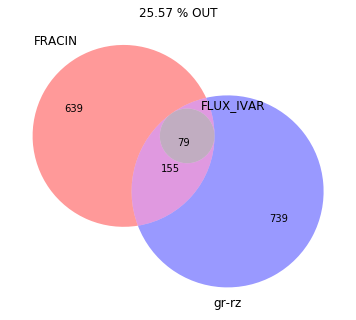

In [15]:
venn_outs_346 = venn_plot(catr, cat, mask_list_MAG,3, 4, 6, ( 'FRACIN', 'FLUX_IVAR', 'gr-rz'), pos='out', title='OUT')

Objects out alone...
FRACFLUX: 1566
FRACIN: 547
gr-rz: 491
Objects out together...
FRACFLUX-FRACIN: 132
FRACFLUX-gr-rz: 288
FRACIN-gr-rz: 234
FRACFLUX-FRACIN-gr-rz: 40
---------------------
3138 objects out of a total 5996 = 52.33 %


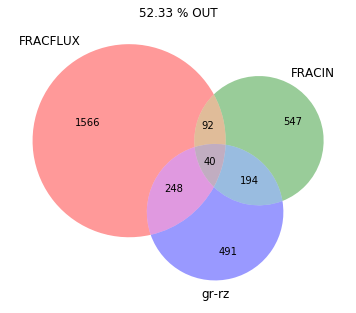

In [16]:
venn_outs_236 = venn_plot(catr, cat, mask_list_MAG, 2,3, 6, ( 'FRACFLUX', 'FRACIN', 'gr-rz'), pos='out', title='OUT')

### Example of objects from LegacySurvey

In [26]:
coord = save_from_venn(catr, venn_outs_125, 'FRACFLUX', 100, 'FRACFLUX_123.dat')

In [65]:
def GAIAGAL(cat):
    g, r, z, w1, G, rr = get_mag_decals(cat)
    GAIA_GAL = np.concatenate((cat[cat['Grr'] > 0.6], cat[G == 0]))
    
    return GAIA_GAL, r

In [27]:
from astropy.utils.data import download_file  #import file from URL
from matplotlib.ticker import NullFormatter

def make_cutout_comparison_table(ra_in, dec_in, N, compare=False, scale_unit='pixscale', scale=0.25, layer='decals-dr7', layer2=None):
    """
    Produces a table comparing LEGACY survey images.
    To see the different layers see: https://github.com/yymao/decals-image-list-tool/blob/master/index.html
    """    
    de_img = []
    wi_img = []
    
    for i in range(N):
        #src='http://legacysurvey.org/viewer-dev/jpeg-cutout/?ra=${ra}&dec=${dec}&${scale_unit}=${scale}&layer=${layer}&size=180'
        de_cutout_url = 'http://legacysurvey.org/viewer-dev/jpeg-cutout/?ra=%g&dec=%g&%s=%g&layer=%s&size=180' % (ra_in[i],dec_in[i], scale_unit, scale, layer)
        img = plt.imread(download_file(de_cutout_url,cache=True,show_progress=False,timeout=120))
        de_img.append(img)
        
        if compare:
            wi_cutout_url = 'http://legacysurvey.org/viewer-dev/jpeg-cutout/?ra=%g&dec=%g&%s=%g&layer=%s&size=180' % (ra_in[i],dec_in[i], scale_unit, scale, layer2)
            img = plt.imread(download_file(wi_cutout_url,cache=True,show_progress=False,timeout=120))
            wi_img.append(img)

    return de_img, wi_img

In [67]:
def plot_de_wi(de_img,wi_img, band, table, compare=False):
# Plot images in two rows with 6 images in each row
    fig = plt.figure(figsize=(4*table[1],4*table[0]))

    for i in range(len(de_img)):
        ax = fig.add_subplot(table[0],table[1],i+1)
        ax.imshow(de_img[i])
        #ax.xaxis.set_major_formatter(NullFormatter())
        #ax.yaxis.set_major_formatter(NullFormatter())
        #ax.tick_params(axis='both',which='both',length=0)
        #ax.scatter(rapix[i], decpix[i])
        ax.text(0.1,0.9,'r=%.3f'%(band[i]),transform=ax.transAxes,fontsize=14,color='white')
        #ax.set_xlim([0, 256])
        #ax.set_ylim([0, 256])

    plt.subplots_adjust(wspace=0.07, hspace=0.07)
    
    fig = plt.figure(figsize=(4*table[1],4*table[0]))
    if compare:
        for i in range(len(wi_img)):
            ax = fig.add_subplot(table[0],table[1],i+1)
            ax.imshow(wi_img[i])
        #ax.xaxis.set_major_formatter(NullFormatter())
        #ax.yaxis.set_major_formatter(NullFormatter())
            #ax.tick_params(axis='both',which='both',length=0)
            ax.text(0.1,0.9,'r=%.1f'%(band[i]),transform=ax.transAxes,fontsize=14,color='white')

    plt.subplots_adjust(wspace=0.07, hspace=0.07)

Time
CPU times: user 2.78 s, sys: 79.8 ms, total: 2.86 s
Wall time: 2.86 s


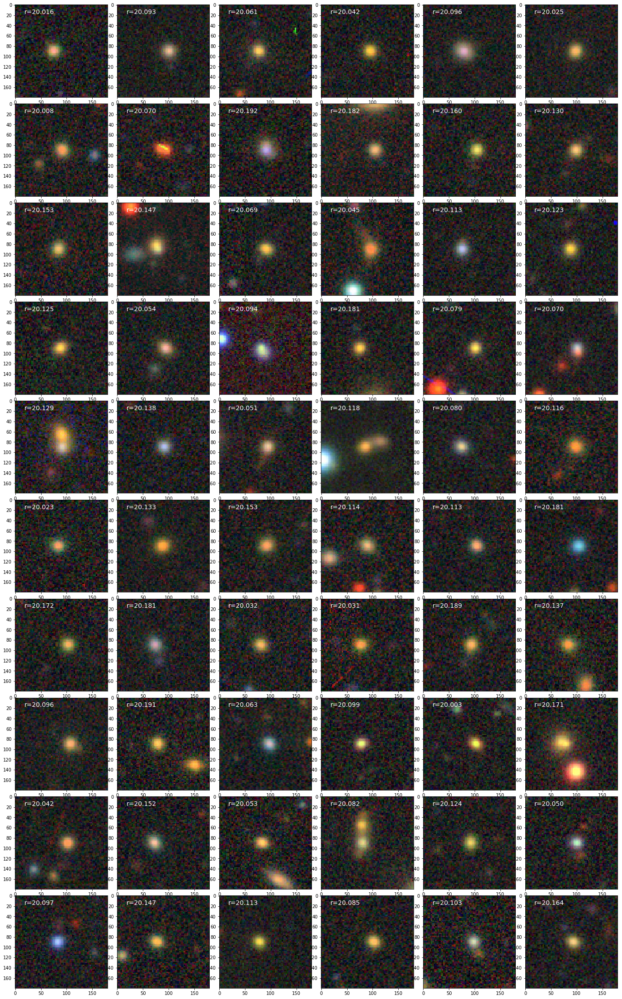

In [69]:
%%time
gaia_gal, r = GAIAGAL(cat)
gaia_gal, r = gaia_gal[:100], r[::100]
n = 10   #rows
m = 6   #columns
table = (n,m)
de_img,wi_img = make_cutout_comparison_table(gaia_gal['RA'], gaia_gal['DEC'], n*m, compare=False, scale_unit='pixscale',
                                             scale=0.1, layer='decals-dr7', layer2=None)
plot_de_wi(de_img,wi_img, r, table, False)

#print(len(de_img[0]), len(wi_img[0]))
print('Time')

### QUALITY CUTS SKY DISTRIBUTION

915
BRIGHTSTARINBLOB shared objects with FRACMASKED = 157


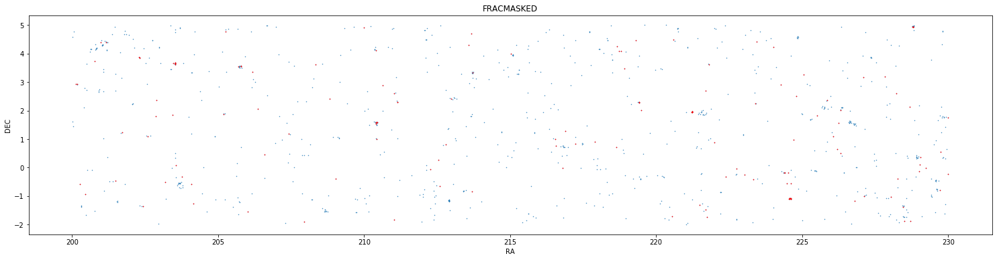

1946
BRIGHTSTARINBLOB shared objects with FRACFLUX = 58


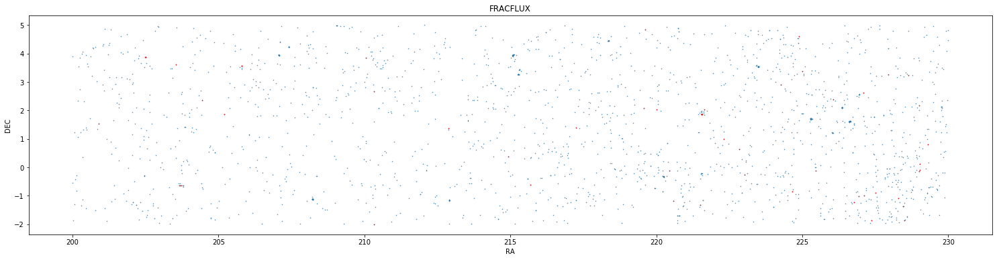

873
BRIGHTSTARINBLOB shared objects with FRACIN = 4


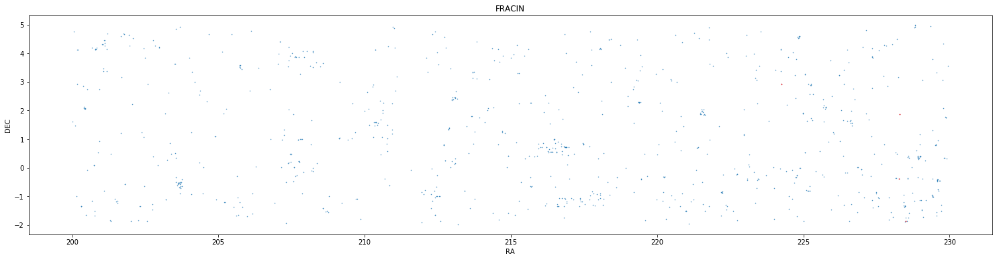

2633
BRIGHTSTARINBLOB shared objects with BRIGHTSTAR = 2633


In [ ]:
def outa(lista):
    return np.array([not i for i in lista])

for x in (1,2,3,5,6):
    
    plt.figure(figsize=(25.71, 6))
    
    mask_x = outa(mask_list_MAG[x])
    mask_xplus = outa(mask_list_MAG[x]) & (outa(mask_list_MAG[5]))
    print(len(catr[mask_x]))
    print('BRIGHTSTARINBLOB shared objects with %s = %d' %(matrix_out.columns[x], len(catr[mask_xplus])))
    plt.title(matrix_out.columns[x])
    plt.scatter(catr[mask_x]['RA'], catr[mask_x]['DEC'], s=0.2)
    plt.scatter(catr[mask_xplus]['RA'], catr[mask_xplus]['DEC'], s=0.4, c='r')
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.show()

### SOME QUALITY CUTS COLOR-COLOR PLOTS

In [20]:
def quality(catr, col):
    
    g, r, z, w1, G, rr = get_mag_decals(catr)
    cumu = np.linspace(catr[col].min(), 1, 40)
    filE = [] #np.zeros((len(cumu), len(cumu), len(cumu), len(cumu)), 'f')
    
    for i in range(len(cumu)):
        
        mask = catr[col] <= cumu[i]
        color_gr = np.array([g[mask]-r[mask]])
        color_gr = color_gr[~np.isnan(color_gr)]
        color_gr = color_gr[~np.isinf(color_gr)]
        filE.append([cumu[i], np.mean(color_gr), color_gr.min(), color_gr.max()])
        
    filE = np.array(filE).transpose()
    
    plt.figure(figsize=(12, 8))
    
    ymin = abs(filE[1] - filE[2])
    ymax = abs(filE[1] - filE[3])
    #plt.errorbar(filE[0], filE[1], yerr = (ymin, ymax), fmt='o', color='black',
    #         ecolor='lightgray', elinewidth=3, capsize=0)
    
    return filE
    

In [21]:
filE = quality(catr, 'FRACMASKED_R')

In [22]:
def quality_color(catr, col, IN):
    print(len(catr))
    
    #import matplotlib.colors as colors
    
    g, r, z, w1, G, rr = get_mag_decals(catr)
    MASKIN = (catr[col+'_R']< IN) & (catr[col+'_G']< IN) & (catr[col+'_Z']< IN) 
    MASKOUT = (catr[col+'_R']>= IN) & (catr[col+'_G']>= IN) & (catr[col+'_Z']>= IN) 
    
    fig, ax = plt.subplots(figsize=(20,10))
    #cax = plt.scatter(g-r, r-z, c = catr[col][MASK], cmap=plt.cm.get_cmap('viridis'), s=1)
    ax.scatter(g[MASKIN]-r[MASKIN], r[MASKIN]-z[MASKIN], s=0.5, label=r'%s < %2.2f, #%d' %(col, IN, len(g[MASKIN])))
    ax.scatter(g[MASKOUT]-r[MASKOUT], r[MASKOUT]-z[MASKOUT], s=0.5, label=r'%s > %2.2f, #%d' %(col, IN, len(g[MASKOUT])))
    ax.set_xlabel(r'g-r')
    ax.set_ylabel(r'r-z')
    ax.set_title(r'BGS')
    ax.set_xlim(-1, 2.8)
    ax.set_ylim(-1.5, 3)
    plt.legend()
    
    #cbar = fig.colorbar(cax)
    #cbar.set_label(col)
    

1162282


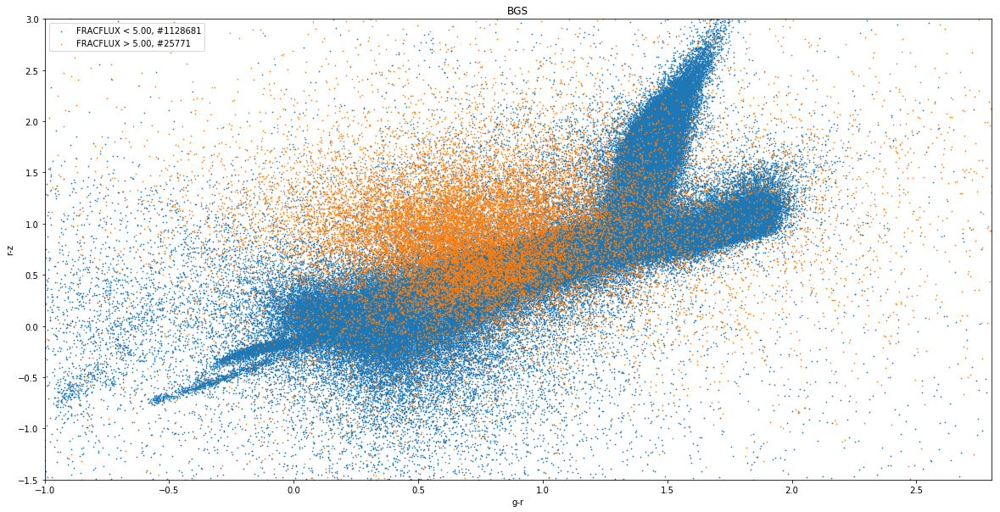

In [23]:
quality_color(catr, 'FRACFLUX', 5)

In [24]:
def color_outs(catr, mask_list_MAG):
    g, r, z, w1, G, rr = get_mag_decals(catr)
    colors = ('r', 'b', 'green', 'cyan', 'black', 'pink', 'orange')
    plt.figure(figsize=(18, 9))
    order = (6,2,3,1,5,0,4)
    
    for x in order:
    
        mask_FRAC = [not i for i in mask_list_MAG[x]]
        print(len(catr[mask_FRAC]))
        if len(catr[mask_FRAC]) < 1000:
            s1 = 1
        else:
            s1 = 0.1
        plt.scatter(g[mask_FRAC]-r[mask_FRAC], r[mask_FRAC]-z[mask_FRAC], s=s1, color=colors[x], label=r'%s -- #%d' %(matrix_out.columns[x], len(r[mask_FRAC])))

    plt.xlabel(r'g-r')
    plt.ylabel(r'r-z')
    plt.xlim(-1, 2.8)
    plt.ylim(-1.5, 3)
    lgnd = plt.legend()
    for handle in lgnd.legendHandles:
        handle.set_sizes([14.0])
        #plt.show()

8641
33601
21296
98678
29449
1445
591


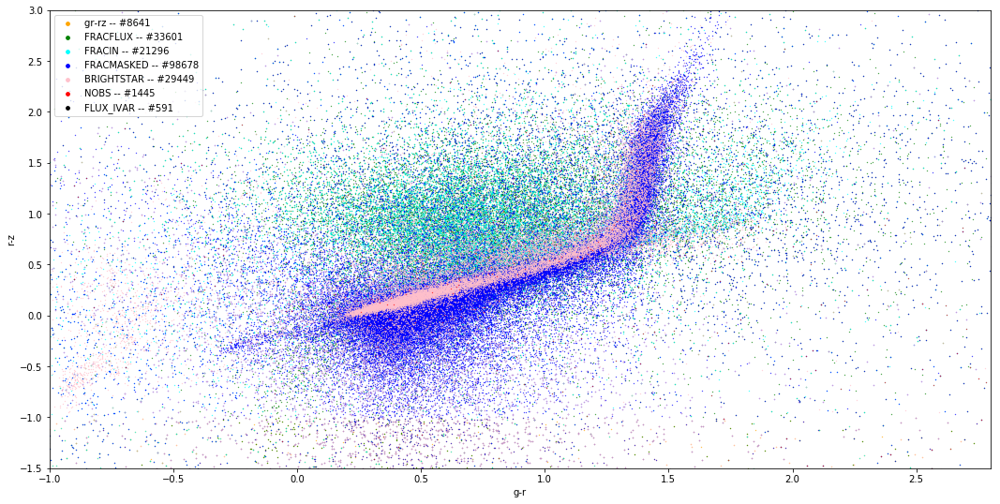

In [25]:
color_outs(catr, mask_list_MAG)

## CATALOGUE AFTER QUALITY CUTS

### PSFSIEZE test

In [26]:
def psfsize_plot(cat, band=('R')):
    
    psfsize = np.linspace(cat['PSFSIZE_R'].min(), cat['PSFSIZE_R'].max(), 80)
    NPSF = cat[cat['TYPE'] == b'PSF ']

    plt.figure(figsize=(16, 8))

    for j in band:
        NPSF_NTOT = np.zeros(len(psfsize), 'float')
        for i in range(len(psfsize)-1):
            if len(cat[cat['PSFSIZE_'+j] < psfsize[i]]) == 0:
                NPSF_NTOT[i] = 0
            else:
                NPSF_NTOT[i] = len(NPSF[NPSF['PSFSIZE_'+j] < psfsize[i]])/len(cat[cat['PSFSIZE_'+j] < psfsize[i]])
            
        plt.plot(psfsize, NPSF_NTOT, linewidth=2, label=r'PSFSIZE_'+j)

        plt.xlabel(r'PSFSIZE')
        plt.ylabel(r'N(GAIA_GAL+PSF)/N(GAIA_GAL)')
        plt.legend()
        print('band %s done...' %(j))
        
    plt.show()

band G done...
band R done...


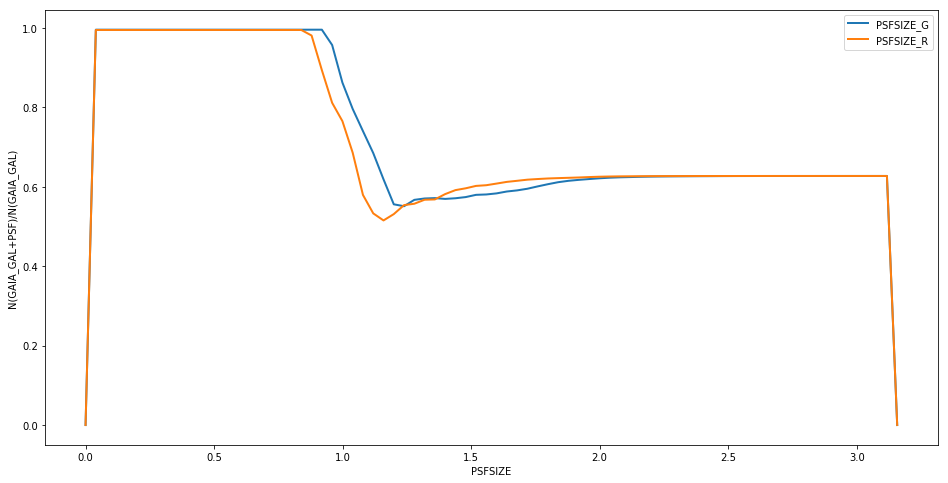

In [27]:
psfsize_plot(cat, band=('G', 'R'))

### z-w1-(g-r) Vs g-r for 0.6 > Grr 

In [33]:
def zw1_gr(cat, Grr_min, Grr_max):
    
    GAIA_STAR = cat[np.logical_and(cat['Grr'] < Grr_max, cat['Grr'] > Grr_min)]
    g, r, z, w1, G, rr = get_mag_decals(GAIA_STAR)
    GAIA_STARup =GAIA_STAR[z - w1 - (g - r) > -0.5]
    GAIA_STARdown =GAIA_STAR[z - w1 - (g - r) < -0.5]

    g1, r1, z1, w11, G1, rr1 = get_mag_decals(GAIA_STARup)
    g2, r2, z2, w12, G2, rr2 = get_mag_decals(GAIA_STARdown)

    #GAIA ULTIMATE STARS UP
    gr_psf_up = g1[GAIA_STARup['TYPE'] == b'PSF '] - r1[GAIA_STARup['TYPE'] == b'PSF ']
    zw_psf_up = z1[GAIA_STARup['TYPE'] == b'PSF '] - w11[GAIA_STARup['TYPE'] == b'PSF '] - (gr_psf_up)
    gr_nopsf_up = g1[GAIA_STARup['TYPE'] != b'PSF '] - r1[GAIA_STARup['TYPE'] != b'PSF ']
    zw_nopsf_up = z1[GAIA_STARup['TYPE'] != b'PSF '] - w11[GAIA_STARup['TYPE'] != b'PSF '] - (gr_nopsf_up)
    #GAIA ULTIMATE STARS DOWN
    gr_psf_down = g2[GAIA_STARdown['TYPE'] == b'PSF '] - r2[GAIA_STARdown['TYPE'] == b'PSF ']
    zw_psf_down = z2[GAIA_STARdown['TYPE'] == b'PSF '] - w12[GAIA_STARdown['TYPE'] == b'PSF '] - (gr_psf_down)
    gr_nopsf_down = g2[GAIA_STARdown['TYPE'] != b'PSF '] - r2[GAIA_STARdown['TYPE'] != b'PSF ']
    zw_nopsf_down = z2[GAIA_STARdown['TYPE'] != b'PSF '] - w12[GAIA_STARdown['TYPE'] != b'PSF '] - (gr_nopsf_down)

    plt.figure(figsize=(12, 8))

    plt.scatter(gr_psf_up, zw_psf_up, s=0.01, color='green', label = r'-1 < Grr < -0.4 & z-w1-(g-r) > -0.5, N=%g' %(len(zw_psf_up)))
    plt.scatter(gr_psf_down, zw_psf_down, s=0.01, color='red', label = r'-1 < Grr < -0.4 & z-w1-(g-r) < -0.5, N=%g' %(len(zw_psf_down)))
    
    if len(zw_nopsf_up) > 800:
        s1 = 0.03
    else:
        s1 = 0.5
        
    if len(zw_nopsf_down) > 800:
        s2 = 0.03
    else:
        s2 = 0.5
    
    #plt.scatter(gr_nopsf_up, zw_nopsf_up, s=s1, color='blue', label = r'cat & Non-PSF > -0.5, N=%g' %(len(zw_nopsf_up)))
    #plt.scatter(gr_nopsf_down, zw_nopsf_down, s=s2, color='blue', label = r'cat & Non-PSF < -0.5, N=%g' %(len(zw_nopsf_down)))
    plt.axhline(-0.5)

    plt.xlabel(r'g-r')
    plt.ylabel(r'z-W-(g-r)')
    plt.title(r'%2.2f > Grr > %2.2f ' %(Grr_max, Grr_min))
    #plt.grid()
    plt.xlim(-1.3, 3.3)
    plt.ylim(-6.3, 4.3)
    lgnd = plt.legend()
    for handle in lgnd.legendHandles:
        handle.set_sizes([14.0])
    
    plt.show()

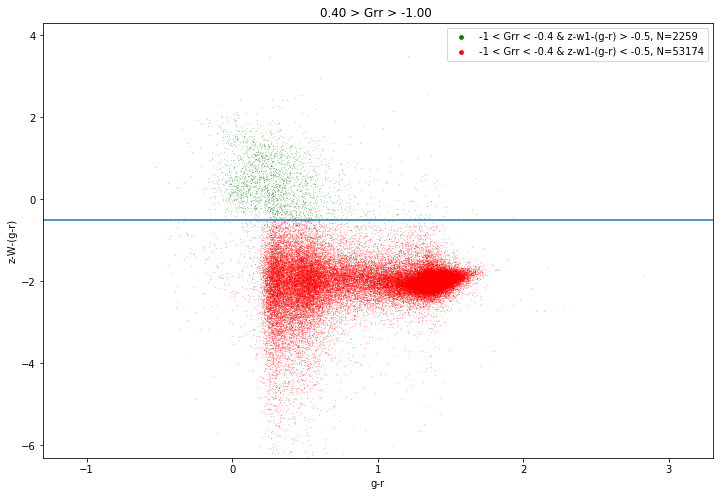

In [35]:
zw1_gr(cat, -1, 0.4)

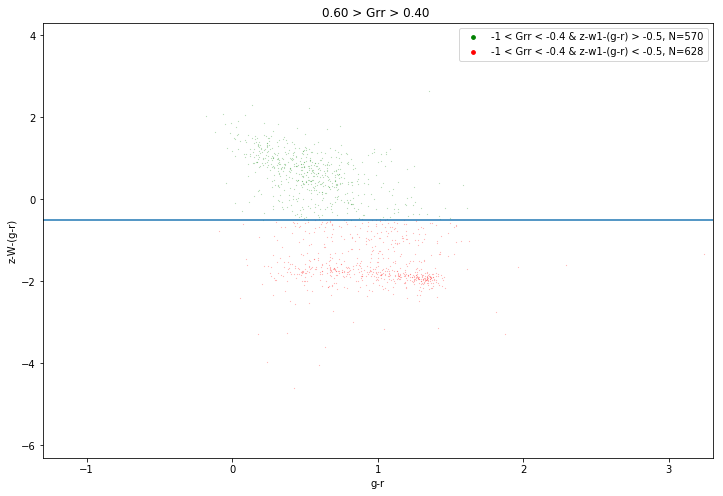

In [30]:
zw1_gr(cat, 0.4, 0.6)

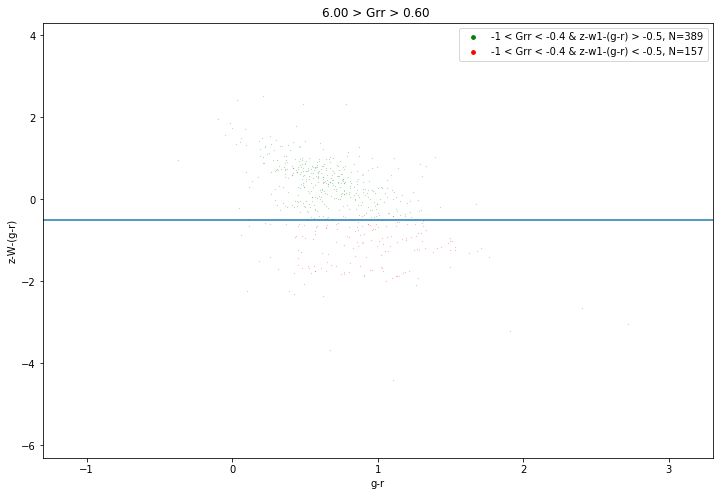

In [31]:
zw1_gr(cat, 0.6, 6)

### DESI_TARGET and BGS_TARGET content

### G-r Vs g-z

All matchs with GAIA in the sample: 57639


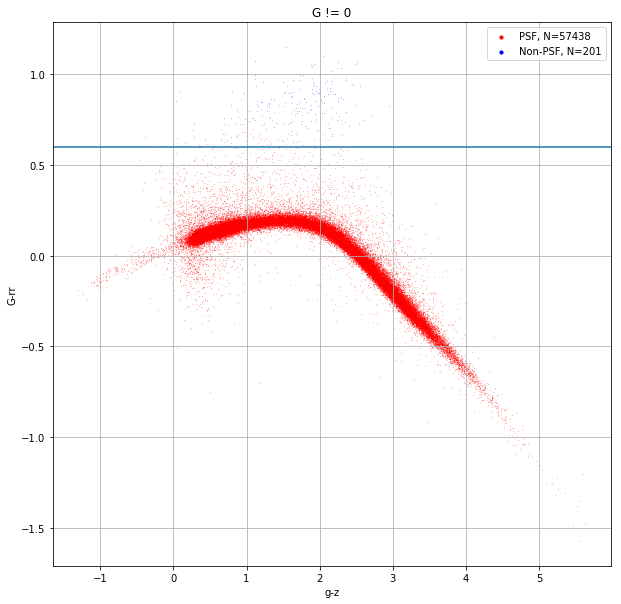

In [36]:
#G-r vs g-z
#del gmag, rmag, zmag, w1mag, Gmag
gmag, rmag, zmag, w1mag, Gmag, rr = get_mag_decals(cat)

Grr = cat['Grr'] #Gmag - rr  #rr is without extinction correction
Gmag = cat['GAIA_PHOT_G_MEAN_MAG']

star = cat['TYPE'] == b'PSF ' 
galaxy = cat['TYPE'] != b'PSF '
maskt = Gmag != 0
print('All matchs with GAIA in the sample:',len(cat[maskt]))

plt.figure(figsize=(10, 10))

plt.scatter(gmag[(star) & (maskt)] - zmag[(star) & (maskt)], Gmag[(star) & (maskt)] - rr[(star) & (maskt)], s=0.01, color='red', label = r'PSF, N=%g' %(len(gmag[(star) & (maskt)])))
plt.scatter(gmag[(galaxy) & (maskt)] - zmag[(galaxy) & (maskt)], Gmag[(galaxy) & (maskt)] - rr[(galaxy) & (maskt)], s=0.01, color='blue', label = r'Non-PSF, N=%g' %(len(gmag[(galaxy) & (maskt)])))
plt.axhline(0.6)

plt.xlabel(r'g-z')
plt.ylabel(r'G-rr')
plt.title(r'G != 0')
plt.grid()
lgnd = plt.legend(fontsize=10)
for handle in lgnd.legendHandles:
    handle.set_sizes([10.0])
plt.show()

#### STAR-GALAXY with GAIA:

* GAIA\_GAL = np.concatenate((cat[Grr $>$ 0.6], cat[Gmag == 0])) 

* GAIA\_STAR = cat[(Grr $<$ 0.6) & (Gmag != 0)]

#### STAR-GALAXY with DECaLS DR7:

* DECALS\_GAL = cat[cat['TYPE'] != b'PSF ']

* DECALS\_STAR = cat[cat['TYPE'] == b'PSF '] 

In [49]:
#columns0 = ['RA', 'DEC', 'DESI_TARGET', 'BGS_TARGET']
TrgCat = '/global/homes/q/qmxp55/DESI/desitarget_data/targetdir/targets-dr7.1-0.26.0.fits'
catT = fitsio.read(TrgCat, ext=1)
catT = cut(200, 230, -2,5, catT)

In [50]:
catTBGS = catT[((np.uint64(catT['DESI_TARGET']) & np.uint64(desi_mask['BGS_ANY']))!=0)]

In [51]:
gT, rT, zT, w1T, GT, rrT = get_mag_decals(catTBGS)

### r-z Vs g-r 

cat with Grr > 0.6: 237
cat with Gmag = 0: 68056
concatenate cat: 68293


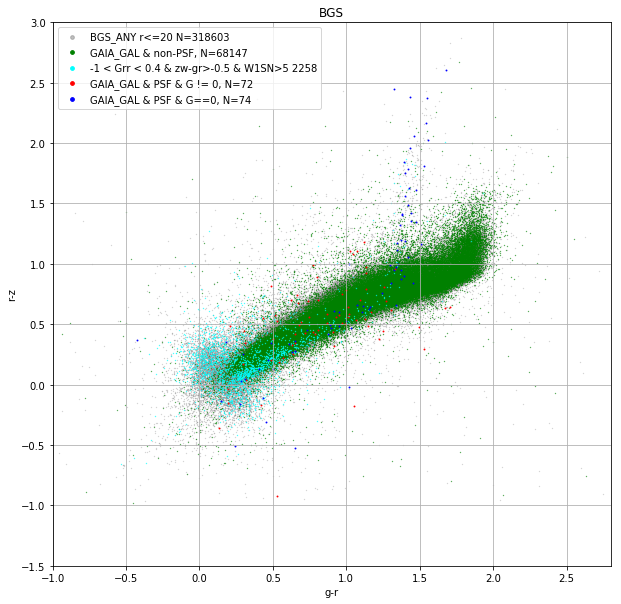

In [56]:
#r-z vs g-r

cat_bgs = np.concatenate((cat[Grr > 0.6], cat[Gmag == 0]))
print('cat with Grr > 0.6:',len(cat[Grr > 0.6]))
print('cat with Gmag = 0:',len(cat[Gmag == 0]))
print('concatenate cat:', len(cat_bgs))

g, r, z, w1, G, rr = get_mag_decals(cat_bgs)

Gstar = G[cat_bgs['TYPE'] == b'PSF ']
Ggalaxy = G[cat_bgs['TYPE'] != b'PSF ']

gr_star = g[cat_bgs['TYPE'] == b'PSF '] - r[cat_bgs['TYPE'] == b'PSF ']
rz_star = r[cat_bgs['TYPE'] == b'PSF '] - z[cat_bgs['TYPE'] == b'PSF ']
gr_galaxy = g[cat_bgs['TYPE'] != b'PSF '] - r[cat_bgs['TYPE'] != b'PSF ']
rz_galaxy = r[cat_bgs['TYPE'] != b'PSF '] - z[cat_bgs['TYPE'] != b'PSF ']

#del g1, r1, z1, w11, G1, g, r, z, w1, G, GAIA_STAR
mask_star = np.logical_and(Grr < 0.4, Grr > -1)
GAIA_STAR = cat[mask_star]
g, r, z, w1, G, rr = get_mag_decals(GAIA_STAR)
GAIA_STARup =GAIA_STAR[(z - w1 - (g - r) > -0.5) & (GAIA_STAR['FLUX_W1']*np.sqrt(GAIA_STAR['FLUX_IVAR_W1']) > 5)]
g1, r1, z1, w11, G1, rr1 = get_mag_decals(GAIA_STARup)

plt.figure(figsize=(10, 10))

plt.scatter(gT - rT, rT - zT, s=0.08, color='gray', alpha=0.5, label='BGS_ANY r<=20 N=%g' %(len(catTBGS)))

plt.scatter(gr_galaxy, rz_galaxy, s=0.08, color='green', label = r'GAIA_GAL & non-PSF, N=%g' %(len(gr_galaxy)))
plt.scatter(g1 - r1, r1 - z1, s=0.1, color='cyan', label = r'-1 < Grr < 0.4 & zw-gr>-0.5 & W1SN>5 %#i' %(len(g1)))
plt.scatter(gr_star[Gstar != 0], rz_star[Gstar != 0], s=0.8, color='red', label = r'GAIA_GAL & PSF & G != 0, N=%g' %(len(gr_star[Gstar != 0])))
plt.scatter(gr_star[Gstar == 0], rz_star[Gstar == 0], s=0.8, color='blue', label = r'GAIA_GAL & PSF & G==0, N=%g' %(len(gr_star[Gstar == 0])))

#plt.scatter(gmag[Gmag == 0] - rmag[Gmag == 0], rmag[Gmag == 0] - zmag[Gmag == 0], s=0.1, color='red')
#plt.scatter(gmag[Grr > 0.9] - rmag[Grr > 0.9], rmag[Grr > 0.9] - zmag[Grr > 0.9], s=0.1, color='black')
plt.xlabel(r'g-r')
plt.ylabel(r'r-z')
#plt.title(r'Grr > 0.6 & !GAIA')
plt.title(r'BGS')
plt.xlim(-1, 2.8)
plt.ylim(-1.5, 3)
plt.grid()
lgnd = plt.legend()
for handle in lgnd.legendHandles:
    handle.set_sizes([14.0])
plt.show()


In [34]:
len(GAIA_STAR)

633159

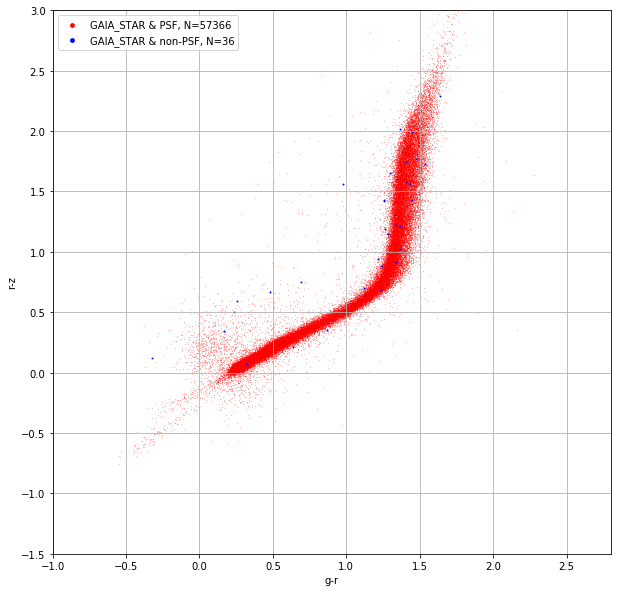

In [57]:
# r-z vs g-r
#Grr = Gmag - rmag
GAIA_GAL = np.concatenate((cat[Grr > 0.6], cat[Gmag == 0]))
GAIA_STAR = cat[(Grr  <  0.6) & (Gmag != 0)]

g1, r1, z1, w11, G1, rr1 = get_mag_decals(GAIA_GAL)
g2, r2, z2, w12, G2, rr2 = get_mag_decals(GAIA_STAR)

#GAIA GALAXIES
gr_GAL_psf = g1[GAIA_GAL['TYPE'] == b'PSF '] - r1[GAIA_GAL['TYPE'] == b'PSF ']
rz_GAL_psf = r1[GAIA_GAL['TYPE'] == b'PSF '] - z1[GAIA_GAL['TYPE'] == b'PSF ']
gr_GAL_nopsf = g1[GAIA_GAL['TYPE'] != b'PSF '] - r1[GAIA_GAL['TYPE'] != b'PSF ']
rz_GAL_nopsf = r1[GAIA_GAL['TYPE'] != b'PSF '] - z1[GAIA_GAL['TYPE'] != b'PSF ']

#GAIA STARS
gr_STAR_psf = g2[GAIA_STAR['TYPE'] == b'PSF '] - r2[GAIA_STAR['TYPE'] == b'PSF ']
rz_STAR_psf = r2[GAIA_STAR['TYPE'] == b'PSF '] - z2[GAIA_STAR['TYPE'] == b'PSF ']
gr_STAR_nopsf = g2[GAIA_STAR['TYPE'] != b'PSF '] - r2[GAIA_STAR['TYPE'] != b'PSF ']
rz_STAR_nopsf = r2[GAIA_STAR['TYPE'] != b'PSF '] - z2[GAIA_STAR['TYPE'] != b'PSF ']

plt.figure(figsize=(10, 10))

#plt.scatter(gr_GAL_nopsf, rz_GAL_nopsf, s=0.01, color='blue', label = r'GAIA_GAL & non-PSF, N=%g' %(len(gr_GAL_nopsf)))
#plt.scatter(gr_GAL_psf, rz_GAL_psf, s=0.08, color='red', label = r'GAIA_GAL & PSF, N=%g' %(len(gr_GAL_psf)))

plt.scatter(gr_STAR_psf, rz_STAR_psf, s=0.01, color='red', label = r'GAIA_STAR & PSF, N=%g' %(len(gr_STAR_psf)))
plt.scatter(gr_STAR_nopsf, rz_STAR_nopsf, s=0.8, color='blue', label = r'GAIA_STAR & non-PSF, N=%g' %(len(gr_STAR_nopsf)))

plt.xlabel(r'g-r')
plt.ylabel(r'r-z')
#plt.title(r'')
#plt.grid()
plt.xlim(-1, 2.8)
plt.ylim(-1.5, 3)
plt.grid()
lgnd = plt.legend()
for handle in lgnd.legendHandles:
    handle.set_sizes([14.0])
plt.show()

In [58]:
def target_con(df, NAME):
    
    target_desi = ("BGS_ANY", "QSO", "LRG", "ELG", "BAD_SKY", "NO_TARGET", "BRIGHT_OBJECT", "MWS_ANY", "STD_BRIGHT", "STD_FAINT", "IN_BRIGHT_OBJECT", "NEAR_BRIGHT_OBJECT")
    target_bgs = ("BGS_FAINT", "BGS_BRIGHT")
    print('Total #%s: %g'%(NAME,len(df)))
    print('desitarget matches: %g -- bgstarget matches: %g'%(len(df[df['desitarget'] != 0]) ,len(df[df['bgstarget'] != 0])))
    print('Of which...')
    target_l = []
    for i in target_desi:
        
        target_per = len(df[((np.uint64(df['desitarget']) & np.uint64(desi_mask[i]))!=0)])
        if target_per == 0:
            continue
        print('%s: %2.4g %%' %(i, 100*target_per/len(df)))
        target_l.append([i, 100*target_per/len(df)])
        
    for i in target_bgs:
        
        target_per = len(df[((np.uint64(df['bgstarget']) & np.uint64(bgs_mask[i]))!=0)])
        if target_per == 0:
            continue
        print('%s: %2.4g %%' %(i, 100*target_per/len(df)))
        target_l.append([i, 100*target_per/len(df)])
    
    print('%s: %2.4g %%' %('G==0', 100*len(df[df['GAIA_PHOT_G_MEAN_MAG'] == 0])/len(df)))
    target_l.append(['G==0', 100*len(df[df['GAIA_PHOT_G_MEAN_MAG'] == 0])/len(df)])
    print('%s: %2.4g %%' %('PSF', 100*len(df[df['TYPE'] == b'PSF '])/len(df)))
    target_l.append(['PSF', 100*len(df[df['TYPE'] == b'PSF '])/len(df)])
    print('%s: %2.4g %%' %('no-PSF', 100*len(df[df['TYPE'] != b'PSF '])/len(df)))
    target_l.append(['no-PSF', 100*len(df[df['TYPE'] != b'PSF '])/len(df)])
    print('%s: %2.4g %%' %('desitarget non matches', 100*len(df[df['desitarget'] == 0])/len(df)))
    target_l.append(['desitarget non matches', 100*len(df[df['desitarget'] == 0])/len(df)])
    print('%s: %2.4g %%' %('bgstarget non matches', 100*len(df[df['bgstarget'] == 0])/len(df)))
    target_l.append(['bgstarget non matches', 100*len(df[df['bgstarget'] == 0])/len(df)])
    
    return target_l

In [59]:
target_cat_bgs = target_con(cat_bgs, 'Grr > 0.6 Or G==0')

Total #Grr > 0.6 Or G==0: 68293


ValueError: no field of name desitarget

In [38]:
target_GAIA_STAR = target_con(GAIA_STAR, 'Grr < 0.6 + G!=0')

Total #Grr < 0.6 + G!=0: 634591
desitarget matches: 335834 -- bgstarget matches: 8561
Of which...
BGS_ANY: 1.349 %
QSO: 0.459 %
LRG: 0.01418 %
MWS_ANY: 51.02 %
STD_BRIGHT: 3.129 %
STD_FAINT: 5.853 %
G==0:  0 %
PSF: 99.96 %
no-PSF: 0.04066 %
desitarget non matches: 47.08 %
bgstarget non matches: 98.65 %


In [39]:
target_WISE = target_con(GAIA_STARup, 'Grr<0.4 & zw-gr>-0.5 & W1SN>5')

Total #Grr<0.4 & zw-gr>-0.5 & W1SN>5: 10819
desitarget matches: 10423 -- bgstarget matches: 8561
Of which...
BGS_ANY: 79.13 %
QSO: 17.08 %
LRG: 0.1202 %
MWS_ANY: 20.03 %
STD_BRIGHT: 0.08319 %
STD_FAINT: 0.7394 %
G==0:  0 %
PSF: 99.96 %
no-PSF: 0.03697 %
desitarget non matches: 3.66 %
bgstarget non matches: 20.87 %


In [61]:
#Save catalogue for visualization in yymao:https://yymao.github.io/decals-image-list-tool/
t_psf= Table()
t_nopsf= Table()
t_wise= Table()
CAT_PSF = cat_bgs[cat_bgs['TYPE'] == b'PSF ']
CAT_NOPSF = GAIA_STAR[GAIA_STAR['TYPE'] != b'PSF ']
t_psf['ra'] = CAT_PSF['RA']
t_psf['dec'] = CAT_PSF['DEC']
t_nopsf['ra'] = CAT_NOPSF['RA']
t_nopsf['dec'] = CAT_NOPSF['DEC']
t_wise['ra'] = GAIA_STARup['RA']
t_wise['dec'] = GAIA_STARup['DEC']
ascii.write(t_nopsf[:300], 'GAIA_STAR+NOPSF.dat', overwrite=True)
ascii.write(t_psf[:300], 'GAIA_GAL+PSF.dat', overwrite=True)
ascii.write(t_wise[::100], 'BGS_WISE.dat', overwrite=True)

In [41]:
g, r, z, w1, G, rr = get_mag_decals(cat_bgs)
len(G)

378335

In [42]:
x1 = Table()
x1['ra'] = cat_bgs[(cat_bgs['TYPE'] == b'PSF ') & (G == 0)]['RA']
x1['dec'] = cat_bgs[(cat_bgs['TYPE'] == b'PSF ') & (G == 0)]['DEC']
ascii.write(x1, 'x1_blue.dat', overwrite=True)

## The differences between GAIA and DECaLS BGS classification

* GAIA_GAL + PSF: Compared to the OLD DECaLS classification, this are the new additional objects that get into the New BGS selection.

* GAIA_STAR + no-PSF: Compared to the OLD DECaLS classification, this are the objects that no loonger take part in the New BGS selection.

This means:

    BGS_GAIA = BGS_DECaLS + GAIA_GAL+PSF - GAIA_STAR+NoPSF

In [43]:
N_BGS_D = len(cat[cat['TYPE'] != b'PSF '])
N_BGS_G = len(GAIA_GAL)
print('BGS_GAIA(%i) = BGS_DECaLS(%i) + GAIA_GAL+PSF(%i) - GAIA_STAR+NoPSF(%i)' %(N_BGS_G, N_BGS_D,len(GAIA_GAL[GAIA_GAL['TYPE'] == b'PSF ']), len(GAIA_STAR[GAIA_STAR['TYPE'] != b'PSF '])))
DIFF = N_BGS_G == N_BGS_D + len(GAIA_GAL[GAIA_GAL['TYPE'] == b'PSF ']) - len(GAIA_STAR[GAIA_STAR['TYPE'] != b'PSF '])

if DIFF:
    print('EVERYTHING MATCH ALRIGHT!')
else:
    print('OPS! SOMETHING DONT MATCH!')

BGS_GAIA(378335) = BGS_DECaLS(377621) + GAIA_GAL+PSF(972) - GAIA_STAR+NoPSF(258)
EVERYTHING MATCH ALRIGHT!


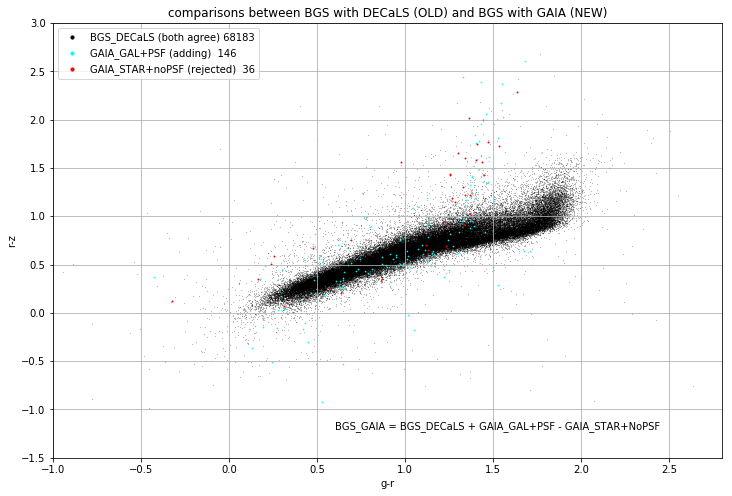

In [60]:
plt.figure(figsize=(12, 8))
bgs_old = cat['TYPE'] != b'PSF '
gaia_star = GAIA_STAR['TYPE'] != b'PSF '
gaia_gal = GAIA_GAL['TYPE'] == b'PSF '

plt.scatter(gmag[bgs_old] - rmag[bgs_old], rmag[bgs_old] - zmag[bgs_old], s=0.01, color='black', label = r'BGS_DECaLS (both agree) %#i' %(len(cat[bgs_old])))
plt.scatter(g1[gaia_gal] - r1[gaia_gal], r1[gaia_gal] - z1[gaia_gal], s=0.4, color='cyan', label = r'GAIA_GAL+PSF (adding)  %#i' %(len(z1[gaia_gal])))
plt.scatter(g2[gaia_star] - r2[gaia_star], r2[gaia_star] - z2[gaia_star], s=0.8, color='red', label = r'GAIA_STAR+noPSF (rejected)  %#i' %(len(z2[gaia_star])))
plt.text(0.6, -1.2, r'BGS_GAIA = BGS_DECaLS + GAIA_GAL+PSF - GAIA_STAR+NoPSF')

plt.xlabel(r'g-r')
plt.ylabel(r'r-z')
#plt.title(r'Grr > 0.6 & !GAIA')
plt.title(r'comparisons between BGS with DECaLS (OLD) and BGS with GAIA (NEW)')
plt.xlim(-1, 2.8)
plt.ylim(-1.5, 3)
plt.grid()
lgnd = plt.legend()
for handle in lgnd.legendHandles:
    handle.set_sizes([10.0])
plt.show()

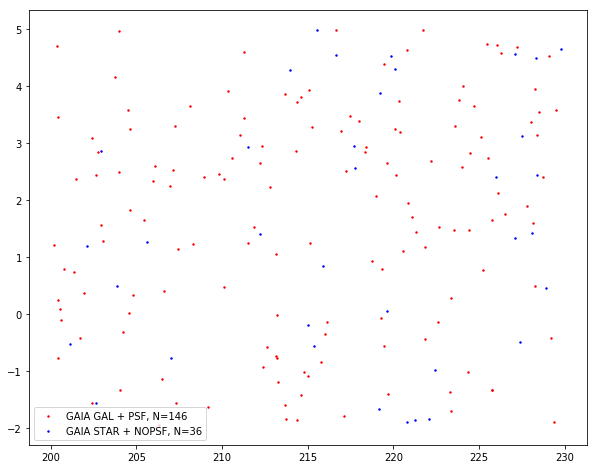

In [62]:
plt.figure(figsize=(10,8))
plt.scatter(t_psf['ra'], t_psf['dec'], s=2, color='red', label = r'GAIA GAL + PSF, N=%g' %(len(t_psf)))
plt.scatter(t_nopsf['ra'], t_nopsf['dec'], s=2, color='blue', label = r'GAIA STAR + NOPSF, N=%g' %(len(t_nopsf)))
plt.legend()

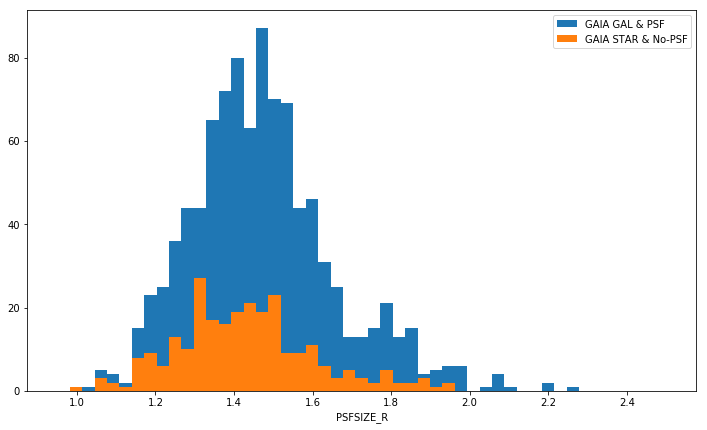

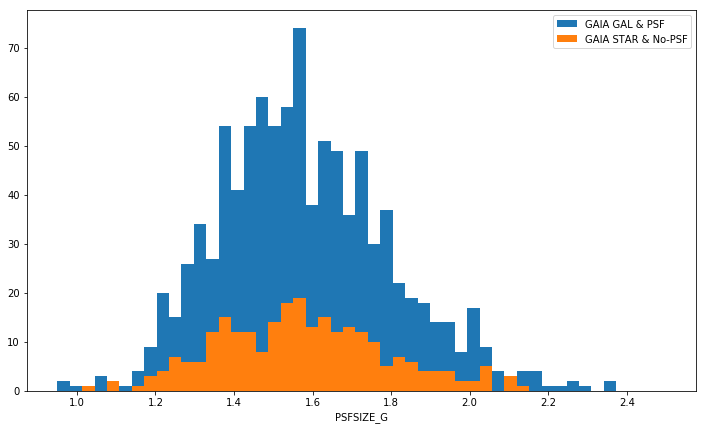

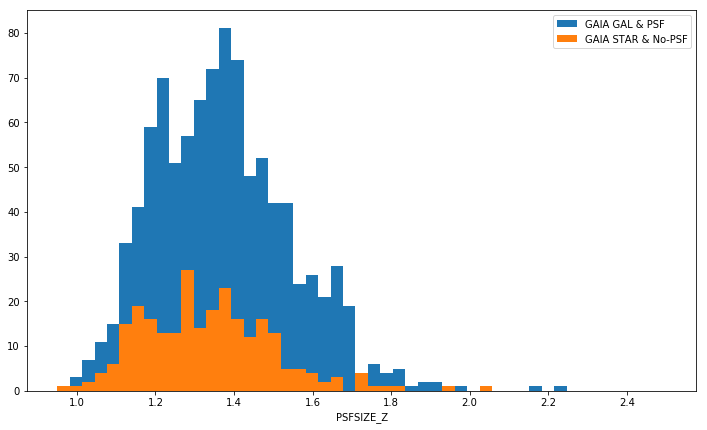

In [46]:
#CAT_PSF is just GAIA GAL & PSF
#CAT_NOPSF is GAIA STAR & NoPSF

bins = np.linspace(0.95, 2.5, 50)
bands = ('R', 'G', 'Z')
for i in bands:
    plt.figure(figsize=(12, 7))
    plt.hist(CAT_PSF['PSFSIZE_'+i], bins=bins, label=r'GAIA GAL & PSF')
    plt.hist(CAT_NOPSF['PSFSIZE_'+i], bins=bins, label=r'GAIA STAR & No-PSF')
    plt.xlabel(r'PSFSIZE_'+i)
    plt.legend()
    plt.show()

## DESI_TARGET and BGS_TARGET

In [47]:
target_CAT_NOPSF = target_con(CAT_NOPSF, 'GAIA STAR + NOPSF')

Total #GAIA STAR + NOPSF: 258
desitarget matches: 8 -- bgstarget matches: 4
Of which...
BGS_ANY: 1.55 %
MWS_ANY: 1.55 %
G==0:  0 %
PSF:  0 %
no-PSF: 100 %
desitarget non matches: 96.9 %
bgstarget non matches: 98.45 %


In [48]:
target_CAT_PSF = target_con(CAT_PSF, 'GAIA GAL + PSF')

Total #GAIA GAL + PSF: 972
desitarget matches: 875 -- bgstarget matches: 826
Of which...
BGS_ANY: 84.98 %
QSO: 5.041 %
MWS_ANY: 14.71 %
STD_BRIGHT: 0.1029 %
STD_FAINT: 0.1029 %
BGS_FAINT: 33.23 %
BGS_BRIGHT: 51.75 %
G==0: 43 %
PSF: 100 %
no-PSF:  0 %
desitarget non matches: 9.979 %
bgstarget non matches: 15.02 %


### Ratio of galaxies and Stars defined by GAIA and DECaLS

In [63]:
r_tmp = np.linspace(15.01,20.2,40)
frac_gal = np.zeros(len(r_tmp), dtype='f8')
frac_star = frac_gal.copy()
frac_decals_gal = frac_gal.copy()
frac_decals_star = frac_gal.copy()
frac_gaia_gal = frac_gal.copy()
frac_gaia_star = frac_gal.copy()

#del g,r,z, w1, G, rr
#del GAIA_GAL, GAIA_STAR
g, r, z, w1, G, rr = get_mag_decals(cat)
GAIA_GAL = np.concatenate((cat[G-rr > 0.6], cat[G == 0]))
GAIA_STAR = cat[(G-rr  <  0.6) & (G != 0)]
g1, r1, z1, w11, G1, rr1 = get_mag_decals(GAIA_GAL)
g2, r2, z2, w12, G2, rr2 = get_mag_decals(GAIA_STAR)
j = 0
for i in r_tmp:
    #DECALS_GAL = cat[cat['TYPE'] != b'PSF ']
    #DECALS_STAR = cat[cat['TYPE'] == b'PSF ']
    #DECALS_GAL = cat[r <= i]
    #DECALS_STAR = cat[r <= i]
    
    Ntot = len(cat[r <= i])
    NDECALS_GAL = len(cat[(cat['TYPE'] != b'PSF ') & (r <= i)])
    NDECALS_STAR = len(cat[(cat['TYPE'] == b'PSF ') & (r <= i)])
    NGAIA_GAL = len(GAIA_GAL[r1 <= i])
    NGAIA_STAR = len(GAIA_STAR[r2 <= i])
    
    frac_gal[j] = NDECALS_GAL/NGAIA_GAL
    frac_star[j] = NDECALS_STAR/NGAIA_STAR
    frac_decals_gal[j] = NDECALS_GAL/Ntot
    frac_decals_star[j] = NDECALS_STAR/Ntot
    frac_gaia_gal[j] = NGAIA_GAL/Ntot
    frac_gaia_star[j] = NGAIA_STAR/Ntot
    
    j = j + 1

plt.figure(figsize=(10, 6))

plt.axhline(1, color='red')
plt.plot(r_tmp, frac_gal, marker='o', label=r'frac_gal')
plt.plot(r_tmp, frac_star, marker='o', label=r'frac_star')

plt.xlabel(r'r')
plt.ylabel(r'$f$ (DECALS/GAIA)')
lgnd = plt.legend()
plt.show()

plt.figure(figsize=(10, 6))

plt.plot(r_tmp, frac_decals_gal, marker='o', label=r'frac_decals_gal')
plt.plot(r_tmp, frac_decals_star, marker='o', label=r'frac_decals_star')
plt.plot(r_tmp, frac_gaia_gal, linestyle='--', label=r'frac_gaia_gal')
plt.plot(r_tmp, frac_gaia_star, linestyle='--', label=r'frac_gaia_star')

plt.xlabel(r'r')
plt.ylabel(r'$f$/Ntot')
lgnd = plt.legend()
plt.show()

ZeroDivisionError: division by zero

In [50]:
def fiberflux(GAIA_GAL, GAIA_STAR, col):
    
    #r_tmp = np.linspace(15.01,20.3,40)
    g1, r1, z1, w11, G1, rr1 = get_mag_decals(GAIA_GAL)
    g2, r2, z2, w12, G2, rr2 = get_mag_decals(GAIA_STAR)
    
    fG = GAIA_GAL[col]/GAIA_GAL['FLUX_R']
    fS = GAIA_STAR[col]/GAIA_STAR['FLUX_R']
    
    plt.figure(figsize=(10, 6))
    
    plt.scatter(r1, fG, s=0.1, label = r'GAIA_GAL')
    plt.scatter(r2, fS, s=0.1, label = r'GAIA_STAR')
    plt.ylabel(r'%s/FLUX_R' %(col))
    plt.xlabel(r'rmag')
    plt.grid()
    
    lgnd = plt.legend()
    for handle in lgnd.legendHandles:
        handle.set_sizes([10.0])
    
    #file = []
    
    #for i in range(len(r_tmp)):
        
    #    fG = GAIA_GAL['FIBERFLUX_R'][r1 <= r_tmp[i]]/GAIA_GAL['FLUX_R'][r1 <= r_tmp[i]]
    #    fS = GAIA_STAR['FIBERFLUX_R'][r2 <= r_tmp[i]]/GAIA_STAR['FLUX_R'][r2 <= r_tmp[i]]
    #    file.append([r_tmp[i], fG, fS])
    #file = np.array(file).transpose()
    
    #return file

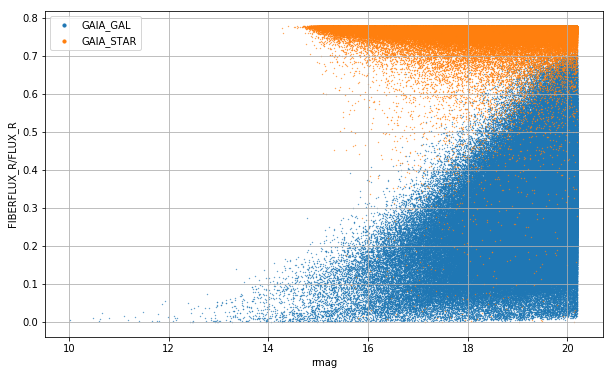

In [51]:
file_GAIA = fiberflux(GAIA_GAL, GAIA_STAR, 'FIBERFLUX_R')

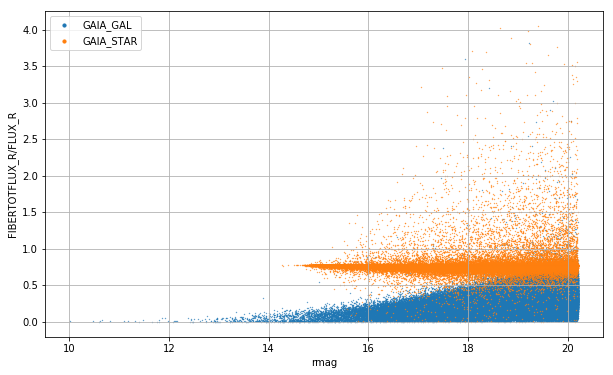

In [52]:
file_GAIA = fiberflux(GAIA_GAL, GAIA_STAR, 'FIBERTOTFLUX_R')

In [53]:
print('GAIA_STAR + No-PSF content:')
GAIA_STAR_TYPE = pd.DataFrame(GAIA_STAR['TYPE'])
print(GAIA_STAR_TYPE[GAIA_STAR_TYPE != b'PSF ']['TYPE'].value_counts())
print('---------------------------------')
print('GAIA_GAL + PSF content:')
GAIA_GAL_TYPE = pd.DataFrame(GAIA_GAL['TYPE'])
print(GAIA_GAL_TYPE[GAIA_GAL_TYPE[0] == b'PSF '][0].value_counts())

GAIA_STAR + No-PSF content:
b'EXP '    135
b'DEV '     64
b'REX '     59
Name: TYPE, dtype: int64
---------------------------------
GAIA_GAL + PSF content:
b'PSF '    972
Name: 0, dtype: int64


gmag, rmag, zmag, w1mag, Gmag, rr = get_mag_decals(cat)
Grr = cat['Grr'] #Gmag - rr  #rr is without extinction correction
Gmag = cat['GAIA_PHOT_G_MEAN_MAG']

mask_wise = np.logical_and(Grr < 0.4, Grr > -1)
mask_wise &= zmag - w1mag - (gmag - rmag) > -0.5
mask_wise &= cat['FLUX_W1']*np.sqrt(cat['FLUX_IVAR_W1']) > 5
cat_wise = cat[mask_wise]

cat_mag = cat[(Grr > 0.6) | (Gmag == 0)]
del gmag, rmag, zmag, w1mag, Gmag, rr
gmag, rmag, zmag, w1mag, Gmag, rr = get_mag_decals(cat_mag)

flux = unextinct_fluxes(cat_mag)

#cat_bgs = np.concatenate((cat[Grr > 0.6], cat[Gmag == 0]))

print('#BGS PREV: FLUX = %d, MAG = %d' %(len(cat0[MASK(cat0, 'BGS_PREV')]), len(cat)))
print('=====================')
print('#BGS FAINT: FLUX = %d, MAG = %d' %(len(cat0[MASK(cat0, 'BGS_FAINT')]), len(cat_mag[np.logical_and(flux['RFLUX'] <= 10**((22.5-19.5)/2.5), flux['RFLUX'] > 10**((22.5-20.0)/2.5))])))
print('#BGS BRIGHT: FLUX = %d, MAG = %d' %(len(cat0[MASK(cat0, 'BGS_BRIGHT')]), len(cat_mag[flux_to_mag(flux['RFLUX']) < 19.5])))
print('#BGS WISE: FLUX = %d, MAG = %d' %(len(cat0[MASK(cat0, 'BGS_WISE')]), len(cat_wise)))